<h1 style="text-align:center">Weather_Classification</h1>


# From Scratch Deep Learning Model


## Import Libraries

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [3]:
# import kagglehub
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.layers import Input,Dense, Conv2D, MaxPool2D, Dropout,Activation,BatchNormalization,Flatten,GlobalMaxPooling2D,Add,Lambda
from keras.layers import Rescaling,RandomFlip,RandomRotation,RandomZoom
from sklearn.metrics import classification_report,confusion_matrix
from keras.models import Model
from keras.utils import set_random_seed

## Global variables

In [4]:
SEED = 1234
EPOCHS = 100
BATCH_SIZE = 32
set_random_seed(SEED)

## Load & Prepare Data

In [5]:
path = "/kaggle/input/weather-dataset"

print("Files and folders in:", path)

Files and folders in: /kaggle/input/weather-dataset


In [6]:
PATH = path + '/dataset'
files_in_dataset= os.listdir(path + '/dataset')
print(f"NO of Files: {len(files_in_dataset)}, Files in the dataset directory: {files_in_dataset}")

NO of Files: 11, Files in the dataset directory: ['hail', 'rainbow', 'frost', 'rime', 'fogsmog', 'snow', 'rain', 'glaze', 'lightning', 'sandstorm', 'dew']


In [7]:
print('No of Images in Hail file:', len(os.listdir(PATH +'/hail')))
print('No of Images in Rainbow file:',len(os.listdir(PATH +'/rainbow')))
print('No of Images in Frost file:',len(os.listdir(PATH +'/frost')))
print('No of Images in Rime file:',len(os.listdir(PATH +'/rime')))
print('No of Images in Fogsmog file:',len(os.listdir(PATH +'/fogsmog')))
print('No of Images in Snow file:',len(os.listdir(PATH +'/snow')))
print('No of Images in Rain file:',len(os.listdir(PATH +'/rain')))
print('No of Images in Glaze file:',len(os.listdir(PATH +'/glaze')))
print('No of Images in Lightning file:',len(os.listdir(PATH +'/lightning')))
print('No of Images in Sandstorm file:',len(os.listdir(PATH +'/sandstorm')))
print('No of Images in Dew file:',len(os.listdir(PATH +'/dew')))

No of Images in Hail file: 591
No of Images in Rainbow file: 232
No of Images in Frost file: 475
No of Images in Rime file: 1160
No of Images in Fogsmog file: 851
No of Images in Snow file: 621
No of Images in Rain file: 526
No of Images in Glaze file: 639
No of Images in Lightning file: 377
No of Images in Sandstorm file: 692
No of Images in Dew file: 698


Data are somehow unbalanced


In [79]:
### to save models data 
model_data ={'Model_name':[],'Train_Accuracy':[],'Validation_Accuracy':[],'Test_Accuracy':[]}

In [8]:
for cls in files_in_dataset:
  image = os.listdir(PATH +'/'+cls)[100]
  image_path = os.path.join(PATH +'/'+cls,image)
  image_shape =(plt.imread(image_path)).shape

  ## check another image
  image1 = os.listdir(PATH +'/'+cls)[200]
  image_path1 = os.path.join(PATH +'/'+cls,image1)
  image_shape1 =(plt.imread(image_path1)).shape

  print(f"{cls.capitalize()} images shape: {image_shape}, {image_shape1}, ..... ")

## There are a wide scale of shapes for image of each class, and inside each class there are many shapes.

Hail images shape: (588, 949, 3), (266, 400, 3), ..... 
Rainbow images shape: (603, 619, 3), (165, 179, 3), ..... 
Frost images shape: (600, 900, 3), (510, 765, 3), ..... 
Rime images shape: (506, 900, 3), (266, 400, 3), ..... 
Fogsmog images shape: (266, 400, 3), (510, 800, 3), ..... 
Snow images shape: (558, 800, 3), (283, 425, 3), ..... 
Rain images shape: (273, 400, 3), (252, 400, 3), ..... 
Glaze images shape: (266, 400, 3), (266, 400, 3), ..... 
Lightning images shape: (215, 342, 3), (800, 1200, 3), ..... 
Sandstorm images shape: (266, 400, 3), (265, 400, 3), ..... 
Dew images shape: (352, 400, 3), (158, 220, 3), ..... 


In [10]:
train_ds, val_test_ds = image_dataset_from_directory(
    directory=PATH,
    batch_size = BATCH_SIZE,
    image_size=(224,224),
    validation_split=0.3,
    subset='both',
    seed=SEED,
      )

class_names = train_ds.class_names
num_classes = len(class_names)
train_batch = tf.data.experimental.cardinality(train_ds).numpy()
print("Class names:", class_names)
print("Number of training batches:",train_batch )
print("Number of val+test batches:", tf.data.experimental.cardinality(val_test_ds).numpy())

val_size = int(tf.data.experimental.cardinality(val_test_ds).numpy() * 0.5) # Split val_test_ds in half

valid_ds = val_test_ds.take(val_size)
test_ds = val_test_ds.skip(val_size)

print("Number of validation batches:", tf.data.experimental.cardinality(valid_ds).numpy())
print("Number of test batches:", tf.data.experimental.cardinality(test_ds).numpy())

Found 6862 files belonging to 11 classes.
Using 4804 files for training.
Using 2058 files for validation.
Class names: ['dew', 'fogsmog', 'frost', 'glaze', 'hail', 'lightning', 'rain', 'rainbow', 'rime', 'sandstorm', 'snow']
Number of training batches: 151
Number of val+test batches: 65
Number of validation batches: 32
Number of test batches: 33


In [11]:
## make the data loading and preprocessing pipeline more efficient and fast for training a deep learning model.
train = train_ds.cache().shuffle(buffer_size=1000).prefetch(tf.data.AUTOTUNE)
valid = valid_ds.cache().prefetch(tf.data.AUTOTUNE)
test = test_ds.cache().prefetch(tf.data.AUTOTUNE)

In [12]:
## true labels for testset.
y_true = []
for images, labels in test:
    y_true.extend(labels.numpy())

## Visualize Data

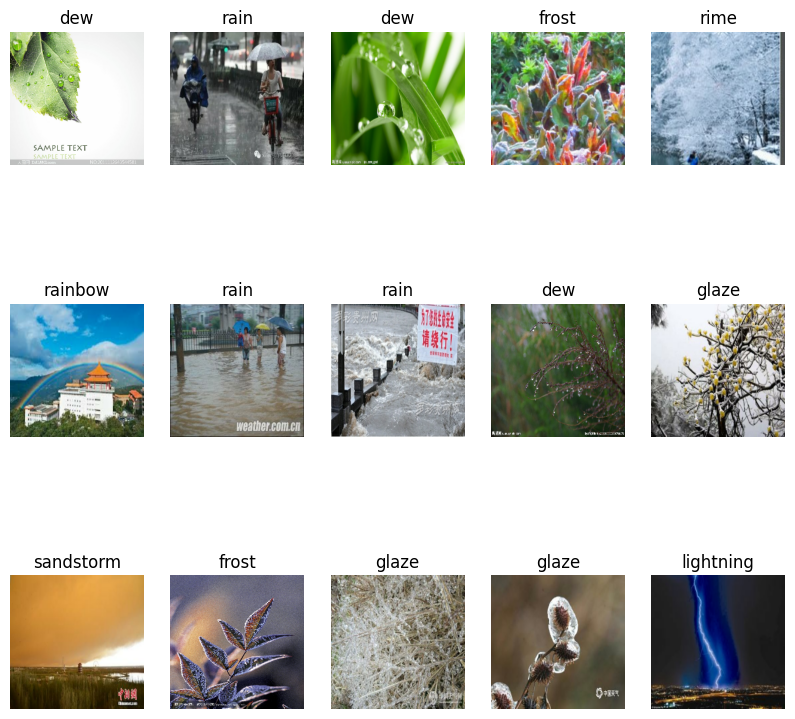

In [13]:
# r_num = np.random.randint(0,train_batch)
fig, ax = plt.subplots(3, 5, figsize=(10, 10))

axis = ax.flatten()
for image_batch, labels_batch in train.take(20):
  for i in range(15):
    axis[i].imshow(image_batch[i].numpy().astype("uint8"))
    axis[i].title.set_text(class_names[labels_batch[i]])
    axis[i].axis('off')

## Build the Model Structure

In [14]:
inputs = Input(shape=(224,224,3))
## Data Augmentation
x = Rescaling(1/255.)(inputs)
x = RandomRotation(0.15)(x)
x = RandomFlip(0.2)(x)
x = RandomZoom(0.2)(x)

x = Conv2D(filters=32,kernel_size=(3,3),activation='relu',padding='same',kernel_initializer='he_normal')(x)
x = Conv2D(filters=64,kernel_size=(5,5),padding='same',kernel_initializer='he_normal')(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = Conv2D(filters=32,kernel_size=(3,3),activation='relu',padding='same',kernel_initializer='he_normal')(x)
x = MaxPool2D()(x)
x = Flatten()(x)

x = Dense(units=512,kernel_initializer='he_normal')(x)
x = Dropout(0.3)(x)
x = Activation('relu')(x)

# x = Dense(units=256,kernel_initializer='he_normal')(x)
# x = Dropout(0.2)(x)
# x = Activation('relu')(x)

x = Dense(units=128,activation='relu',kernel_initializer='he_normal')(x)

outputs = Dense(num_classes,activation='softmax')(x)


model = Model(inputs=inputs,outputs=outputs,name='From_Scratch_Model')
model.summary()

Model: "From_Scratch_Model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ rescaling (Rescaling)                │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_rotation (RandomRotation)     │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_flip (RandomFlip)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_zoom (RandomZoom)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 224, 224, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 224, 224, 64)        │          51,264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 224, 224, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation (Activation)              │ (None, 224, 224, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 224, 224, 32)        │          18,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 401408)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │     205,521,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_1 (Activation)            │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 128)                 │          65,664 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 11)                  │           1,419 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 205,659,371 (784.53 MB)

 Trainable params: 205,659,243 (784.53 MB)

 Non-trainable params: 128 (512.00 B)

In [15]:
model.compile(optimizer=keras.optimizers.Adam(),loss='sparse_categorical_crossentropy',metrics=['accuracy'])
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss',patience=10,restore_best_weights=True)

In [16]:
hist = model.fit(train ,epochs=EPOCHS,validation_data=valid ,callbacks= [early_stop])

Epoch 1/100


I0000 00:00:1747557943.623925     104 cuda_dnn.cc:529] Loaded cuDNN version 90300


151/151 ━━━━━━━━━━━━━━━━━━━━ 45s 212ms/step - accuracy: 0.2377 - loss: 21.0472 - val_accuracy: 0.3535 - val_loss: 1.9420
Epoch 2/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 29s 189ms/step - accuracy: 0.3920 - loss: 1.7354 - val_accuracy: 0.3232 - val_loss: 2.2642
Epoch 3/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 30s 196ms/step - accuracy: 0.4980 - loss: 1.4782 - val_accuracy: 0.4688 - val_loss: 1.5928
Epoch 4/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 30s 196ms/step - accuracy: 0.5237 - loss: 1.3526 - val_accuracy: 0.5107 - val_loss: 1.4038
Epoch 5/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 28s 188ms/step - accuracy: 0.5661 - loss: 1.2462 - val_accuracy: 0.4961 - val_loss: 1.5319
Epoch 6/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 30s 196ms/step - accuracy: 0.5748 - loss: 1.2466 - val_accuracy: 0.5713 - val_loss: 1.3609
Epoch 7/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 28s 189ms/step - accuracy: 0.5867 - loss: 1.1894 - val_accuracy: 0.4854 - val_loss: 1.7155
Epoch 8/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 30s 196ms/step - accuracy: 0.5837 - loss: 1.20

In [17]:
## Evaluation
train_loss,train_acc = model.evaluate(train)
val_loss,val_acc = model.evaluate(valid)
test_loss,test_acc = model.evaluate(test)

print(f'Training Acurracy: {train_acc}')
print(f'Validation Acurracy: {val_acc}')
print(f'Test Acurracy: {test_acc}')

151/151 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - accuracy: 0.7951 - loss: 0.5863
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - accuracy: 0.7087 - loss: 0.8928
33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - accuracy: 0.7261 - loss: 0.9353
Training Acurracy: 0.7932972311973572
Validation Acurracy: 0.7216796875
Test Acurracy: 0.7205029129981995


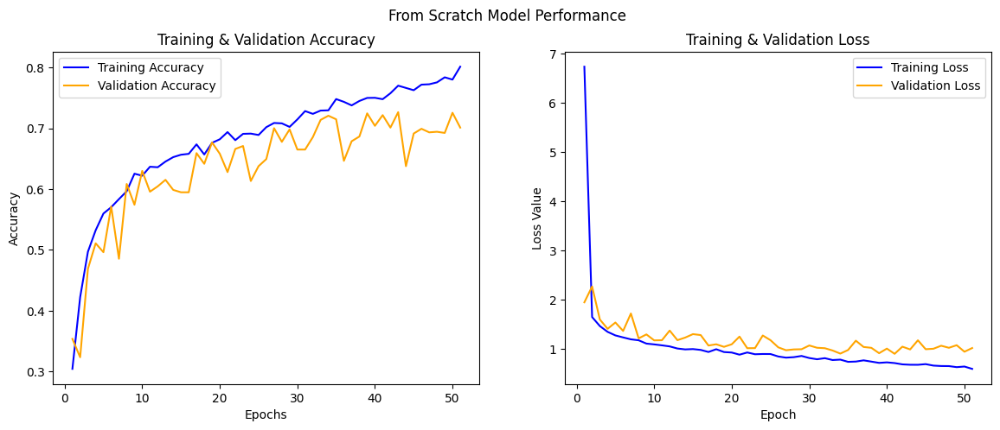

In [19]:
def plot_Acc_loss(history = None,title='From Scratch Model Performance'):
    acc = history.history['accuracy']
    valid_acc = history.history['val_accuracy']
    loss = history.history['loss']
    valid_loss = history.history['val_loss']
    
    epochs = range(1,len(acc)+1)
    
    fig , ax = plt.subplots(1,2,figsize=(14,5))
    
    # Plot Accuracy
    ax[0].plot(epochs,acc,label='Training Accuracy',color='blue')
    ax[0].plot(epochs,valid_acc,label='Validation Accuracy',color='orange')
    ax[0].set_xlabel('Epochs')
    ax[0].set_ylabel('Accuracy')
    ax[0].set_title('Training & Validation Accuracy')
    ax[0].legend()
    
    fig.suptitle(title)
    # Plot Loss
    ax[1].plot(epochs,loss, label='Training Loss', color='blue')
    ax[1].plot(epochs, valid_loss, label='Validation Loss', color='orange')
    ax[1].set_xlabel('Epoch')
    ax[1].set_ylabel('Loss Value')
    ax[1].set_title('Training & Validation Loss')
    ax[1].legend()
    
    plt.show();

plot_Acc_loss(history=hist)

In [21]:
y_pred = np.argmax(model.predict(test), axis=1)

## function for plotting confusion matrix
def plot_confusionMatrix():
    cm = confusion_matrix(y_true, y_pred)
    
    # Plot the confusion matrix
    fig, ax = plt.subplots(figsize=(10, 10))
    im = ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    ax.figure.colorbar(im, ax=ax)
    
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           xticklabels=class_names, yticklabels=class_names,
           title='Confusion Matrix',
           ylabel='True Label',
           xlabel='Predicted Label')
    
    plt.setp(ax.get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')

    fmt = 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha='center', va='center',
                    color='white' if cm[i, j] > thresh else 'black')
    
    fig.tight_layout()
    plt.show();



33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step


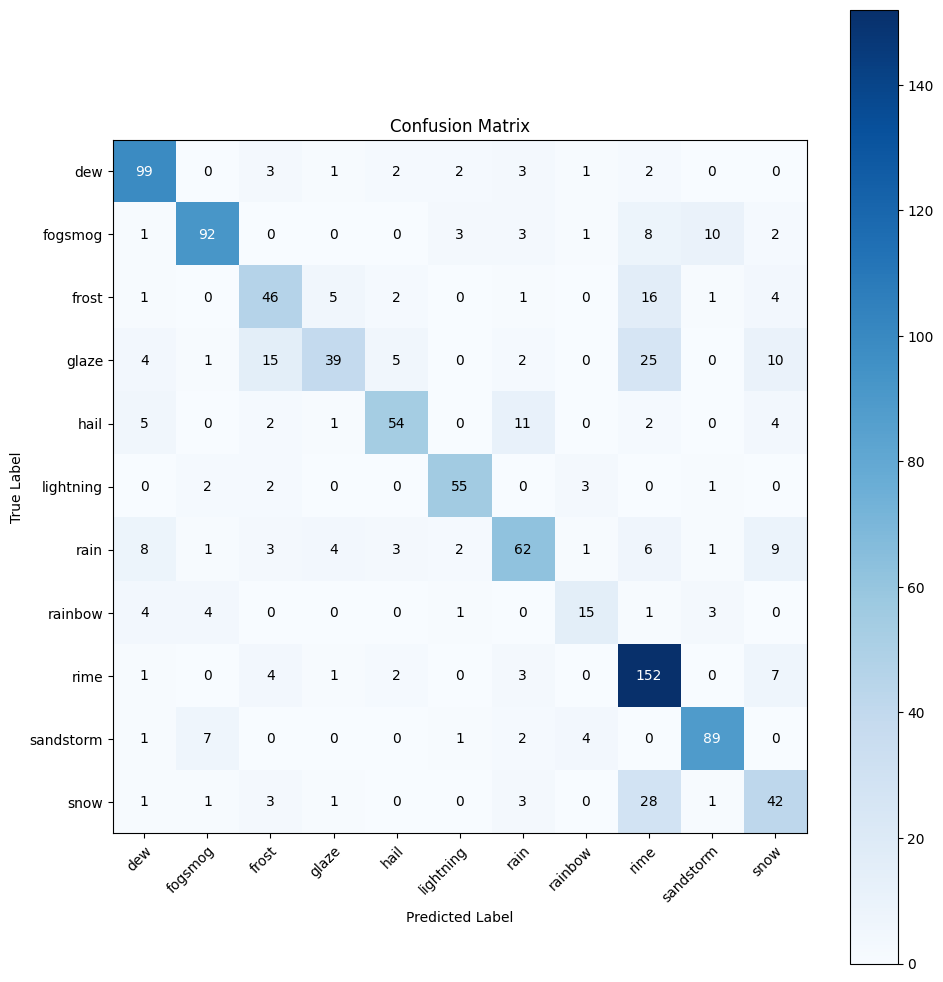

In [22]:
plot_confusionMatrix()

In [23]:
report = classification_report(y_true, y_pred, target_names=class_names, output_dict=True)
df = pd.DataFrame(report).transpose()
df

,precision,recall,f1-score,support
dew,0.792000,0.876106,0.831933,113.000000
fogsmog,0.851852,0.766667,0.807018,120.000000
frost,0.589744,0.605263,0.597403,76.000000
glaze,0.750000,0.386139,0.509804,101.000000
hail,0.794118,0.683544,0.734694,79.000000
lightning,0.859375,0.873016,0.866142,63.000000
rain,0.688889,0.620000,0.652632,100.000000
rainbow,0.600000,0.535714,0.566038,28.000000
rime,0.633333,0.894118,0.741463,170.000000
sandstorm,0.839623,0.855769,0.847619,104.000000


In [24]:
def plot_true_pred(num_images = 12, model=model):
    all_test_images = []
    all_test_labels = []
    for images, labels in test_ds:
      all_test_images.extend(images.numpy())
      all_test_labels.extend(labels.numpy())

    # Convert lists to numpy arrays for easy indexing
    all_test_images = np.array(all_test_images)
    all_test_labels = np.array(all_test_labels)

    # Select random indices from the collected data
    indices = np.random.choice(len(all_test_images), num_images, replace=False)
    images_to_display = all_test_images[indices]

    actual_labels = all_test_labels[indices] # Get actual labels
    predicted_labels = np.argmax(model.predict(images_to_display), axis=1)  # Predict labels


    fig, axes = plt.subplots(3, 4, figsize=(15, 15))

    for i, ax in enumerate(axes.flat):
      ax.imshow(images_to_display[i].astype("uint8"))
      ax.set_title(f'Pred: {class_names[predicted_labels[i]]}, Actual: {class_names[actual_labels[i]]}', fontsize=12)
      ax.axis('off')

    plt.tight_layout()
    plt.show();



1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 573ms/step


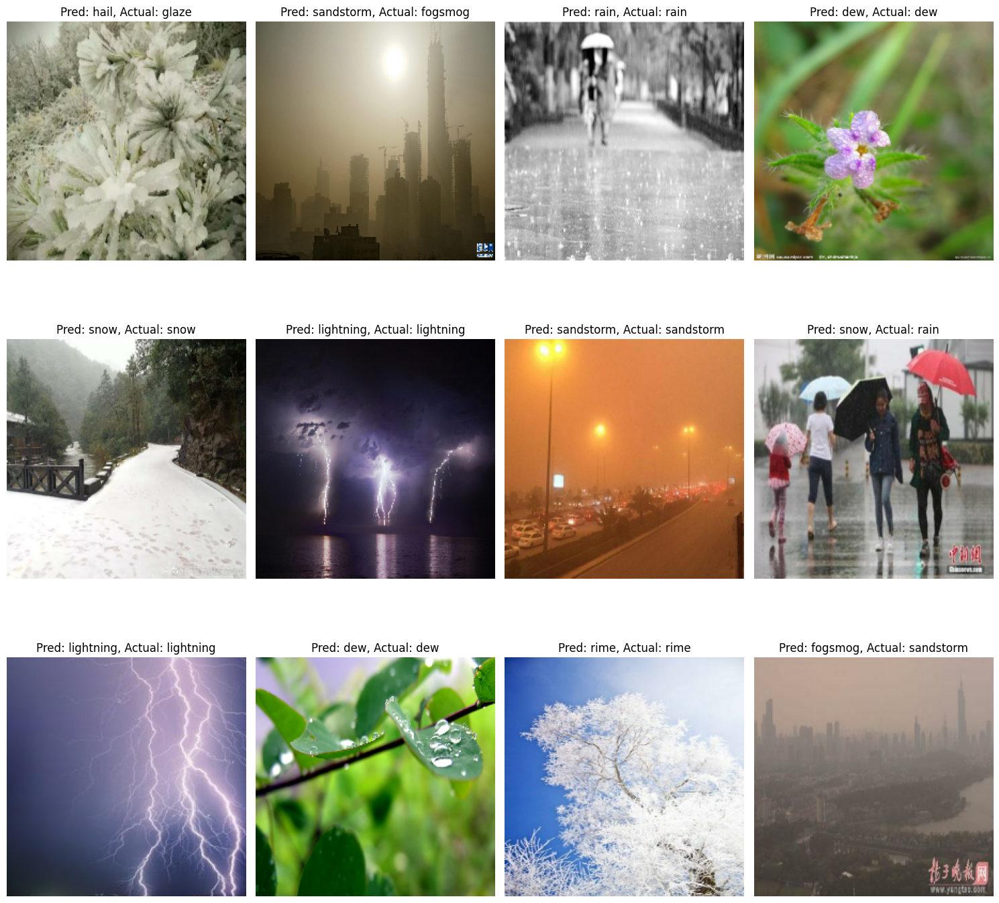

In [25]:
plot_true_pred()

In [93]:
## append results of the model
def save_model_data(model_name="Model",model=None):
    train_loss,train_Acc= model.evaluate(train)
    val_loss,val_Acc = model.evaluate(valid)
    test_loss,test_Acc = model.evaluate(test)
    model_data['Model_name'].append(model_name)
    model_data['Train_Accuracy'].append(train_Acc*100)
    model_data['Validation_Accuracy'].append(val_Acc*100)
    model_data['Test_Accuracy'].append(test_Acc*100)

    print(f'Training Acurracy: {train_Acc*100}')
    print(f'Validation Acurracy: {val_Acc*100}')
    print(f'Test Acurracy: {test_Acc*100}')
    
    model.save(f'{model_name}.h5')
    print('Model Data saved Successfully.')


In [81]:
save_model_data('ScratchModel1',model)

151/151 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - accuracy: 0.8048 - loss: 0.5532
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - accuracy: 0.7087 - loss: 0.8928
33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - accuracy: 0.7261 - loss: 0.9353
Model Data saved Successfully.


-----
## Try Another Structure

#### Building the model

In [44]:
inputs = Input(shape=(224,224,3))

## Data Augmentation
x = Rescaling(1/255.)(inputs)
x = RandomRotation(0.15)(x)
x = RandomFlip(0.25)(x)
x = RandomZoom(0.25)(x)

x = Conv2D(filters=64,kernel_size=(3,3),activation='relu',padding='same',kernel_initializer='he_normal')(x)
x = Conv2D(filters=32,kernel_size=(5,5),padding='same',kernel_initializer='he_normal')(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = Conv2D(filters=16,kernel_size=(3,3),activation='relu',padding='same',kernel_initializer='he_normal')(x)
# x = GlobalMaxPooling2D()(x)
x = MaxPool2D()(x)
x = Flatten()(x)


x = Dense(units=512,kernel_initializer='he_normal')(x)
x = Dropout(0.4)(x)
x = Activation('relu')(x)

x = Dense(units=256,kernel_initializer='he_normal')(x)
x = Dropout(0.4)(x)
x = Activation('relu')(x)

x = Dense(units=128,activation='relu',kernel_initializer='he_normal')(x)

outputs = Dense(num_classes,activation='softmax')(x)


model2 = Model(inputs=inputs,outputs=outputs,name='From_Scratch_Model2')
model2.summary()

Model: "From_Scratch_Model2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ rescaling_5 (Rescaling)              │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_rotation_5 (RandomRotation)   │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_flip_5 (RandomFlip)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_zoom_5 (RandomZoom)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_15 (Conv2D)                   │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_16 (Conv2D)                   │ (None, 224, 224, 32)        │          51,232 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 224, 224, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_11 (Activation)           │ (None, 224, 224, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_17 (Conv2D)                   │ (None, 224, 224, 16)        │           4,624 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 112, 112, 16)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_3 (Flatten)                  │ (None, 200704)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_16 (Dense)                     │ (None, 512)                 │     102,760,960 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_12 (Activation)           │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_17 (Dense)                     │ (None, 256)                 │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_13 (Activation)           │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_18 (Dense)                     │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_19 (Dense)                     │ (None, 11)                  │           1,419 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 102,984,379 (392.85 MB)

 Trainable params: 102,984,315 (392.85 MB)

 Non-trainable params: 64 (256.00 B)

In [45]:
model2.compile(optimizer=keras.optimizers.Adam(),loss='sparse_categorical_crossentropy',metrics=['accuracy'])

In [46]:
hist2 = model2.fit(train ,epochs=EPOCHS,validation_data=valid)

Epoch 1/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - accuracy: 0.1700 - loss: 23.8860 - val_accuracy: 0.3496 - val_loss: 2.0568
Epoch 2/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - accuracy: 0.3770 - loss: 1.8981 - val_accuracy: 0.4492 - val_loss: 1.6587
Epoch 3/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - accuracy: 0.4478 - loss: 1.6573 - val_accuracy: 0.4609 - val_loss: 1.5463
Epoch 4/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - accuracy: 0.4733 - loss: 1.5444 - val_accuracy: 0.4854 - val_loss: 1.5671
Epoch 5/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - accuracy: 0.5086 - loss: 1.4327 - val_accuracy: 0.4258 - val_loss: 1.8205
Epoch 6/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - accuracy: 0.5142 - loss: 1.4133 - val_accuracy: 0.5361 - val_loss: 1.3997
Epoch 7/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - accuracy: 0.5387 - loss: 1.3292 - val_accuracy: 0.5488 - val_loss: 1.3227
Epoch 8/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 19s 127ms/step - accuracy: 0.5452 

In [65]:
## Evaluation
train_loss,train_acc = model2.evaluate(train)
val_loss,val_acc = model2.evaluate(valid)
test_loss,test_acc = model2.evaluate(test)

print(f'Training Acurracy: {train_acc*100}')
print(f'Validation Acurracy: {val_acc*100}')
print(f'Test Acurracy: {test_acc*100}')

151/151 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - accuracy: 0.7950 - loss: 0.6088
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - accuracy: 0.6799 - loss: 1.0221
33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - accuracy: 0.7265 - loss: 0.9341
Training Acurracy: 79.28809523582458
Validation Acurracy: 68.45703125
Test Acurracy: 71.17988467216492


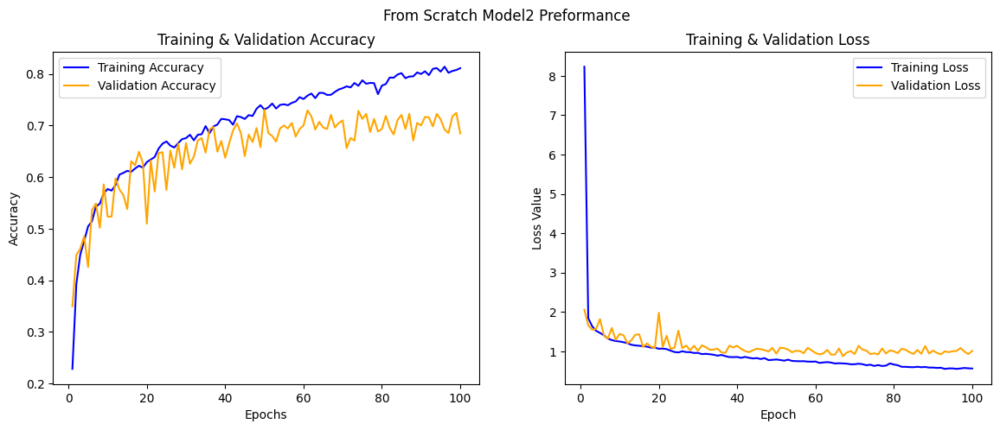

In [48]:
plot_Acc_loss(history=hist2,title='From Scratch Model2 Preformance')

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 564ms/step


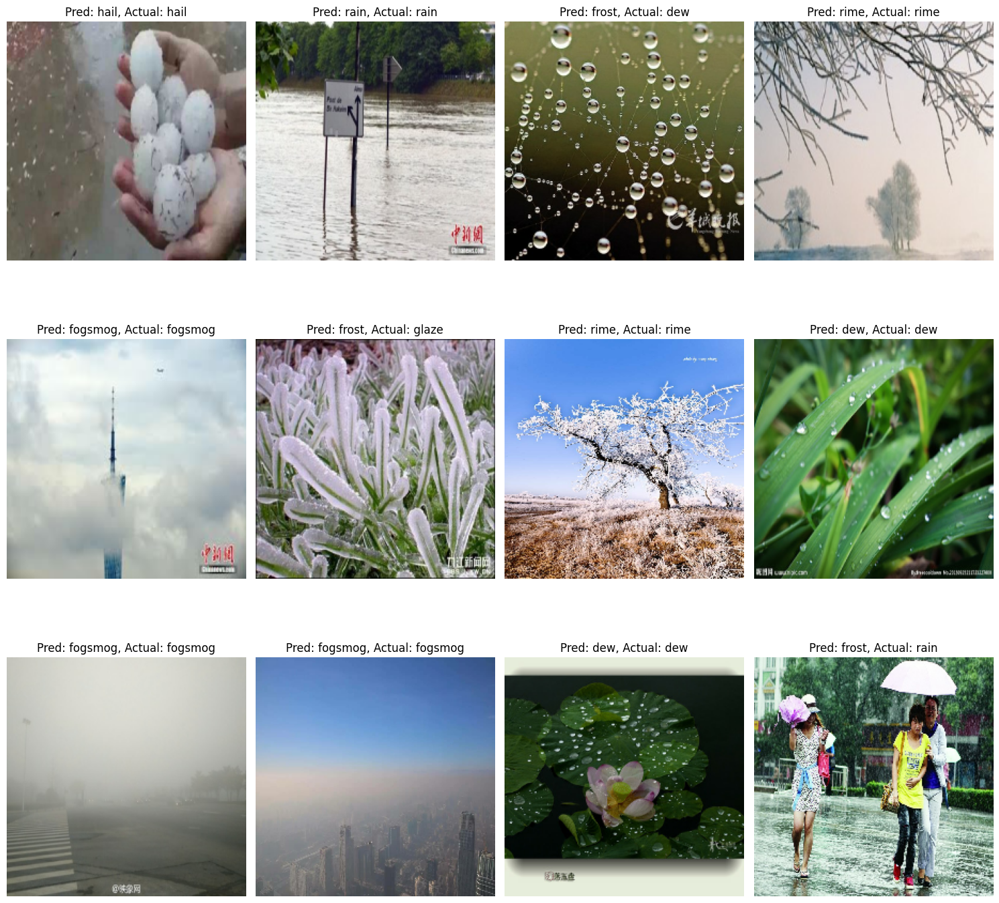

In [50]:
plot_true_pred(model=model2)

In [82]:
save_model_data('ScratchModel2',model2)

151/151 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - accuracy: 0.7817 - loss: 0.6397
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - accuracy: 0.6799 - loss: 1.0221
33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - accuracy: 0.7265 - loss: 0.9341
Model Data saved Successfully.


-----

## Try using Skip Connections in the model Structure

#### Building the model

In [91]:
inputs = Input(shape=(224,224,3))

# Data Augmentation
x = Rescaling(1/255.)(inputs)
x = RandomRotation(0.15)(x)
x = RandomFlip("horizontal")(x)
x = RandomZoom(0.25)(x)

# First Conv Block
x1 = Conv2D(64, (3, 3), padding='same', kernel_initializer='he_normal')(x)
x1 = BatchNormalization()(x1)
x1 = Activation('relu')(x1)

x1 = Conv2D(64, (5, 5), padding='same', kernel_initializer='he_normal')(x1)
x1 = BatchNormalization()(x1)

# Skip connection: input x passed through 1x1 conv to match filters if needed
shortcut1 = Conv2D(64, (1, 1), padding='same', kernel_initializer='he_normal')(x)
shortcut1 = BatchNormalization()(shortcut1)

x1 = Add()([x1, shortcut1])
x1 = Activation('relu')(x1)

# Second Conv Block
x2 = Conv2D(32, (3, 3), padding='same', kernel_initializer='he_normal')(x1)
x2 = BatchNormalization()(x2)
x2 = Activation('relu')(x2)

x2 = Conv2D(64, (5, 5), padding='same', kernel_initializer='he_normal')(x2)
x2 = BatchNormalization()(x2)

# Skip connection from x1 to x2
# Here input has 64 filters, x2 ends with 64 filters, so add directly
x2 = Add()([x2, x1])
x2 = Activation('relu')(x2)

# # Pooling
x = GlobalMaxPooling2D()(x2)
# x = MaxPool2D()(x2)
# x = Flatten()(x)

# Fully connected layers with dropout
x = Dense(1024, kernel_initializer='he_normal')(x)
x = Dropout(0.4)(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)

x = Dense(512, kernel_initializer='he_normal')(x)
x = Dropout(0.4)(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)

x = Dense(256, activation='relu')(x)
x = Dense(128, activation='relu')(x)
outputs = Dense(num_classes, activation='softmax')(x)

model3 = Model(inputs=inputs, outputs=outputs, name='From_Scratch_Model_with_SkipConnections')

model3.summary()

Model: "From_Scratch_Model_with_SkipConnections"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_12            │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling_12 (Rescaling)  │ (None, 224, 224, 3)    │              0 │ input_layer_12[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ random_rotation_12        │ (None, 224, 224, 3)    │              0 │ rescaling_12[0][0]     │
│ (RandomRotation)          │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ random_flip_12            │ (None, 224, 224, 3)    │              0 │ random_rotation_12[0]… │
│ (RandomFlip)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ random_zoom_12            │ (None, 224, 224, 3)    │              0 │ random_flip_12[0][0]   │
│ (RandomZoom)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_48 (Conv2D)        │ (None, 224, 224, 64)   │          1,792 │ random_zoom_12[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_48    │ (None, 224, 224, 64)   │            256 │ conv2d_48[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_50             │ (None, 224, 224, 64)   │              0 │ batch_normalization_4… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_49 (Conv2D)        │ (None, 224, 224, 64)   │        102,464 │ activation_50[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_50 (Conv2D)        │ (None, 224, 224, 64)   │            256 │ random_zoom_12[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_49    │ (None, 224, 224, 64)   │            256 │ conv2d_49[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_50    │ (None, 224, 224, 64)   │            256 │ conv2d_50[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_12 (Add)              │ (None, 224, 224, 64)   │              0 │ batch_normalization_4… │
│                           │                        │                │ batch_normalization_5… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_51             │ (None, 224, 224, 64)   │              0 │ add_12[0][0]           │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_51 (Conv2D)   

 Total params: 938,539 (3.58 MB)

 Trainable params: 934,891 (3.57 MB)

 Non-trainable params: 3,648 (14.25 KB)

#### Compile & Train the model

In [92]:
## compile
model3.compile(optimizer=keras.optimizers.Adam(),loss='sparse_categorical_crossentropy',metrics=['accuracy'])
## train
hist3 = model3.fit(train ,epochs=EPOCHS,validation_data=valid)

Epoch 1/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 66s 382ms/step - accuracy: 0.3209 - loss: 1.9831 - val_accuracy: 0.2656 - val_loss: 2.2402
Epoch 2/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 57s 378ms/step - accuracy: 0.5273 - loss: 1.3469 - val_accuracy: 0.3389 - val_loss: 2.0329
Epoch 3/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 57s 378ms/step - accuracy: 0.5816 - loss: 1.1861 - val_accuracy: 0.3613 - val_loss: 1.9814
Epoch 4/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 57s 378ms/step - accuracy: 0.6356 - loss: 1.0976 - val_accuracy: 0.3555 - val_loss: 2.1159
Epoch 5/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 57s 378ms/step - accuracy: 0.6437 - loss: 1.0356 - val_accuracy: 0.4287 - val_loss: 1.7902
Epoch 6/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 57s 378ms/step - accuracy: 0.6579 - loss: 0.9919 - val_accuracy: 0.4395 - val_loss: 1.8762
Epoch 7/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 57s 378ms/step - accuracy: 0.6908 - loss: 0.9074 - val_accuracy: 0.4111 - val_loss: 2.1570
Epoch 8/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 57s 378ms/step - accuracy: 0.7072 -

#### Evaluate the model

In [94]:
## Evaluation & save the model
save_model_data('Scratch_Model_With_SkipConnection',model3)

151/151 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7656 - loss: 0.7231
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.6899 - loss: 1.0661
33/33 ━━━━━━━━━━━━━━━━━━━━ 3s 90ms/step - accuracy: 0.7441 - loss: 0.9063
Training Acurracy: 76.24896168708801
Validation Acurracy: 70.21484375
Test Acurracy: 74.17795062065125
Model Data saved Successfully.


#### Plot Train & Validation Accuracy and Loss

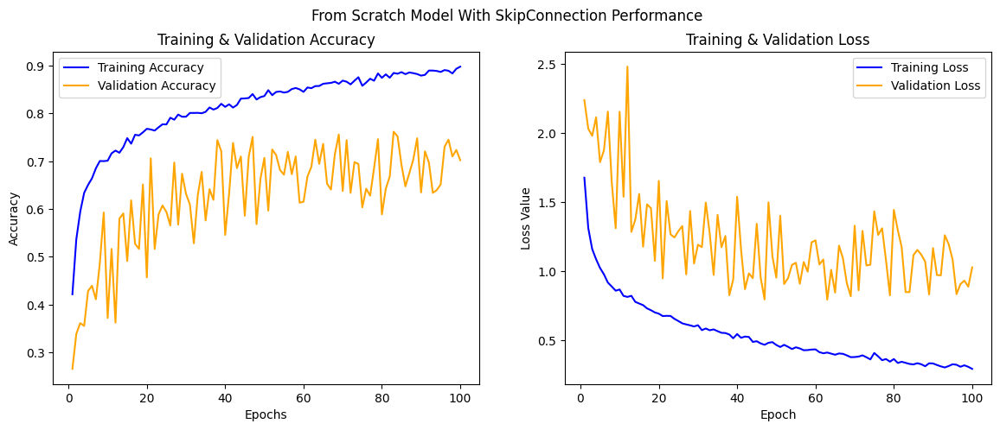

In [96]:
plot_Acc_loss(history=hist3,title='From Scratch Model With SkipConnection Performance')

33/33 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step


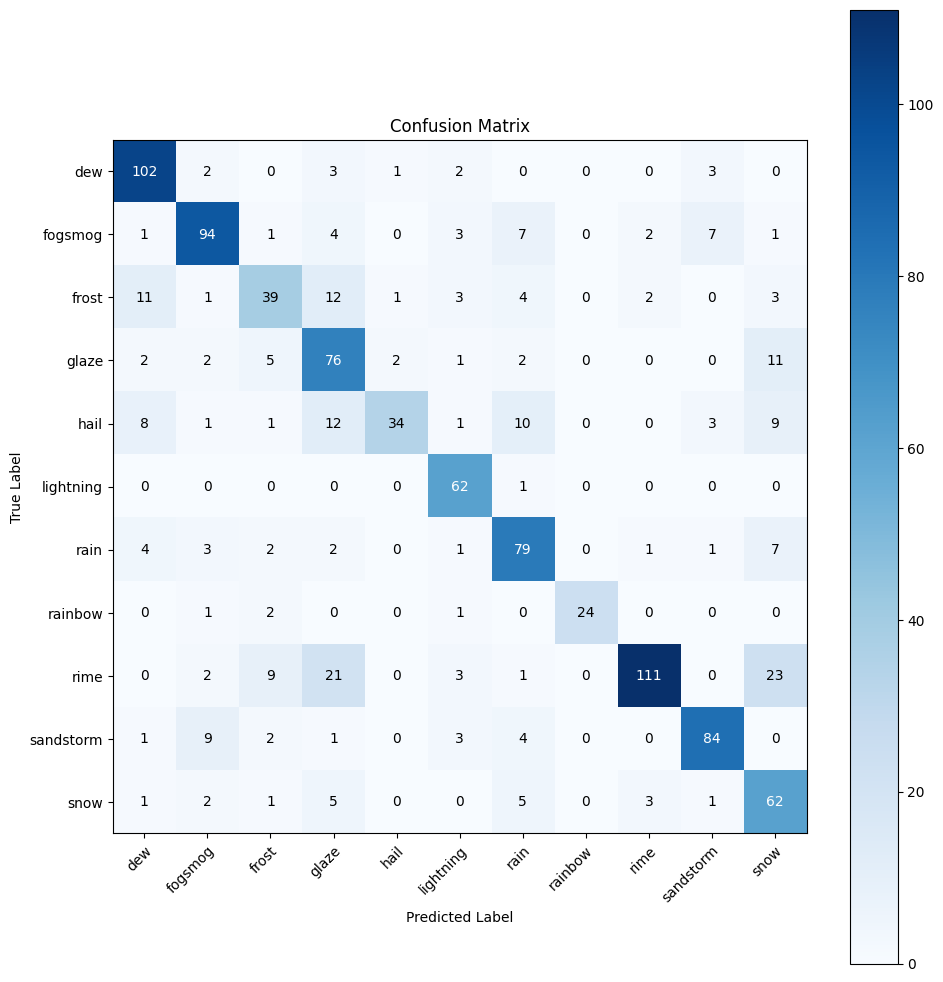

In [97]:
y_pred = np.argmax(model3.predict(test), axis=1)
plot_confusionMatrix()

In [98]:
report = classification_report(y_true, y_pred, target_names=class_names, output_dict=True)
df = pd.DataFrame(report).transpose()
df

,precision,recall,f1-score,support
dew,0.784615,0.902655,0.839506,113.000000
fogsmog,0.803419,0.783333,0.793249,120.000000
frost,0.629032,0.513158,0.565217,76.000000
glaze,0.558824,0.752475,0.641350,101.000000
hail,0.894737,0.430380,0.581197,79.000000
lightning,0.775000,0.984127,0.867133,63.000000
rain,0.699115,0.790000,0.741784,100.000000
rainbow,1.000000,0.857143,0.923077,28.000000
rime,0.932773,0.652941,0.768166,170.000000
sandstorm,0.848485,0.807692,0.827586,104.000000


#### Test Sample

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


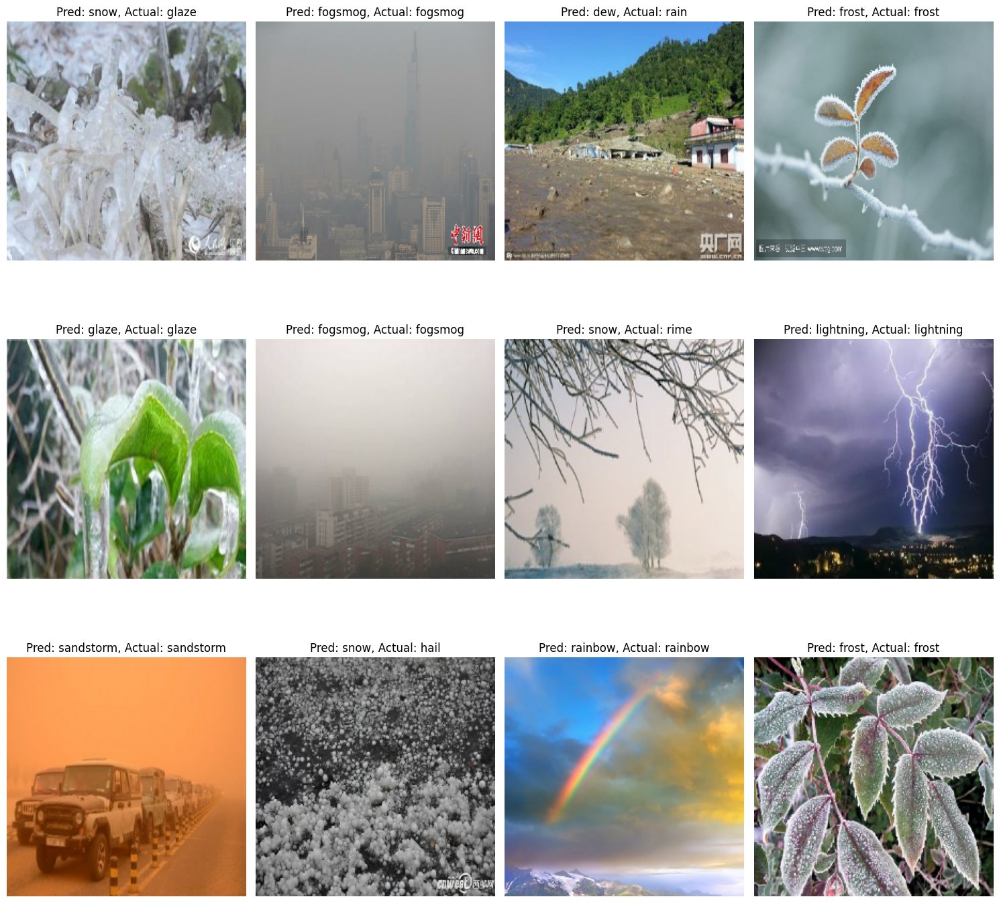

In [100]:
plot_true_pred(model=model3)

---------
# Use Pretrained Models


### Try InceptionResNet model

In [101]:
from keras.applications import InceptionResNetV2
# from keras.applications.inception_resnet_v2 import preprocess_input

In [102]:
base = InceptionResNetV2(include_top=False, weights='imagenet', input_shape=(224, 224, 3))
base.trainable = False 

219055592/219055592 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [106]:
inputs = Input(shape=(224, 224, 3))

# Data Augmentation
x = Lambda(keras.applications.inception_resnet_v2.preprocess_input)(inputs) 
x = RandomFlip()(x)
x = RandomRotation(0.2)(x)
x = RandomZoom(0.2)(x)

## pretrained model and its preprocessing layer
x = base(x)  
x = GlobalMaxPooling2D()(x)

x = Dense(1024,kernel_initializer='he_normal')(x)
x = Dropout(0.4)(x)
x = Activation('relu')(x)

x = Dense(512,kernel_initializer='he_normal')(x)
x = Dropout(0.3)(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)

x = Dense(256,kernel_initializer='he_normal')(x)
x = Dropout(0.3)(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)

x = Dense(128, activation='relu',kernel_initializer='he_normal')(x)

outputs = Dense(num_classes, activation='softmax')(x)

# Final model
pre_model = Model(inputs=inputs, outputs=outputs, name='Pretrained_InceptionResNetV2_Model')
pre_model.summary()


Model: "Pretrained_InceptionResNetV2_Model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_15 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lambda_1 (Lambda)                    │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_flip_14 (RandomFlip)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_rotation_14 (RandomRotation)  │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_zoom_14 (RandomZoom)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ inception_resnet_v2 (Functional)     │ (None, 5, 5, 1536)          │      54,336,736 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling2d_8               │ (None, 1536)                │               0 │
│ (GlobalMaxPooling2D)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_60 (Dense)                     │ (None, 1024)                │       1,573,888 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_25 (Dropout)                 │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_262 (Activation)          │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_61 (Dense)                     │ (None, 512)                 │         524,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_26 (Dropout)                 │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_260              │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_263 (Activation)          │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_62 (Dense)                     │ (None, 256)                 │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_27 (Dropout)                 │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_261              │ (None, 256)                 │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_264 (Activation)          │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_63 (Dense)                     │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_64 (Dense)                     │ (None, 11)                  │           1,4

 Total params: 56,604,139 (215.93 MB)

 Trainable params: 2,265,867 (8.64 MB)

 Non-trainable params: 54,338,272 (207.28 MB)

In [107]:
## compile
pre_model.compile(optimizer=keras.optimizers.Adam(),loss='sparse_categorical_crossentropy',metrics=['accuracy'])

In [108]:
## train
pre_hist = pre_model.fit(train ,epochs=50,validation_data=valid)

Epoch 1/50
151/151 ━━━━━━━━━━━━━━━━━━━━ 60s 206ms/step - accuracy: 0.1905 - loss: 2.3414 - val_accuracy: 0.4717 - val_loss: 1.4280
Epoch 2/50
151/151 ━━━━━━━━━━━━━━━━━━━━ 21s 139ms/step - accuracy: 0.4689 - loss: 1.4750 - val_accuracy: 0.6133 - val_loss: 1.1117
Epoch 3/50
151/151 ━━━━━━━━━━━━━━━━━━━━ 21s 140ms/step - accuracy: 0.5752 - loss: 1.2568 - val_accuracy: 0.6533 - val_loss: 0.9649
Epoch 4/50
151/151 ━━━━━━━━━━━━━━━━━━━━ 21s 139ms/step - accuracy: 0.6000 - loss: 1.1713 - val_accuracy: 0.6758 - val_loss: 0.9690
Epoch 5/50
151/151 ━━━━━━━━━━━━━━━━━━━━ 21s 140ms/step - accuracy: 0.6121 - loss: 1.1124 - val_accuracy: 0.7246 - val_loss: 0.8338
Epoch 6/50
151/151 ━━━━━━━━━━━━━━━━━━━━ 21s 139ms/step - accuracy: 0.6550 - loss: 1.0128 - val_accuracy: 0.6807 - val_loss: 0.9796
Epoch 7/50
151/151 ━━━━━━━━━━━━━━━━━━━━ 21s 139ms/step - accuracy: 0.6710 - loss: 0.9692 - val_accuracy: 0.7324 - val_loss: 0.7931
Epoch 8/50
151/151 ━━━━━━━━━━━━━━━━━━━━ 21s 139ms/step - accuracy: 0.6686 - loss: 0

In [110]:
# Unfreeze the base model
base.trainable = True

# Freeze all layers except the last 50
for layer in base.layers[:-50]:
    layer.trainable = False


In [111]:
pre_model.compile(optimizer = keras.optimizers.Adam(learning_rate=1e-5),loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [112]:
history_finetune = pre_model.fit(train, epochs=20, validation_data=valid)

Epoch 1/20
151/151 ━━━━━━━━━━━━━━━━━━━━ 69s 213ms/step - accuracy: 0.7350 - loss: 0.8164 - val_accuracy: 0.7852 - val_loss: 0.6419
Epoch 2/20
151/151 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - accuracy: 0.7677 - loss: 0.6933 - val_accuracy: 0.7949 - val_loss: 0.6265
Epoch 3/20
151/151 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - accuracy: 0.7851 - loss: 0.6169 - val_accuracy: 0.7969 - val_loss: 0.6048
Epoch 4/20
151/151 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - accuracy: 0.8204 - loss: 0.5546 - val_accuracy: 0.8027 - val_loss: 0.5908
Epoch 5/20
151/151 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - accuracy: 0.8106 - loss: 0.5438 - val_accuracy: 0.8066 - val_loss: 0.5740
Epoch 6/20
151/151 ━━━━━━━━━━━━━━━━━━━━ 23s 152ms/step - accuracy: 0.8235 - loss: 0.5370 - val_accuracy: 0.8125 - val_loss: 0.5627
Epoch 7/20
151/151 ━━━━━━━━━━━━━━━━━━━━ 23s 152ms/step - accuracy: 0.8138 - loss: 0.5470 - val_accuracy: 0.8105 - val_loss: 0.5520
Epoch 8/20
151/151 ━━━━━━━━━━━━━━━━━━━━ 23s 152ms/step - accuracy: 0.8301 - loss: 0

#### Evaluation

In [116]:
save_model_data(model_name='InceptionResNetV2',model=pre_model)

151/151 ━━━━━━━━━━━━━━━━━━━━ 16s 109ms/step - accuracy: 0.8979 - loss: 0.3090
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 108ms/step - accuracy: 0.8445 - loss: 0.5036
33/33 ━━━━━━━━━━━━━━━━━━━━ 4s 107ms/step - accuracy: 0.8325 - loss: 0.4785
Training Acurracy: 89.55037593841553
Validation Acurracy: 84.765625
Test Acurracy: 85.10638475418091
Model Data saved Successfully.


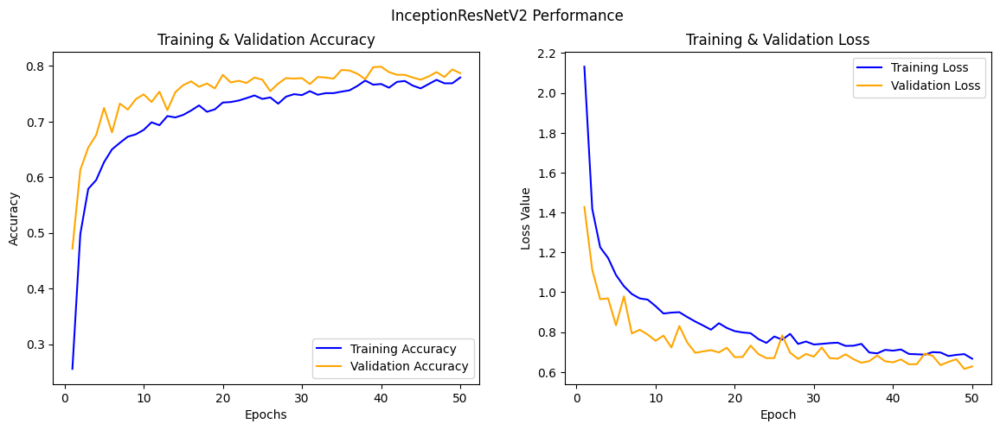

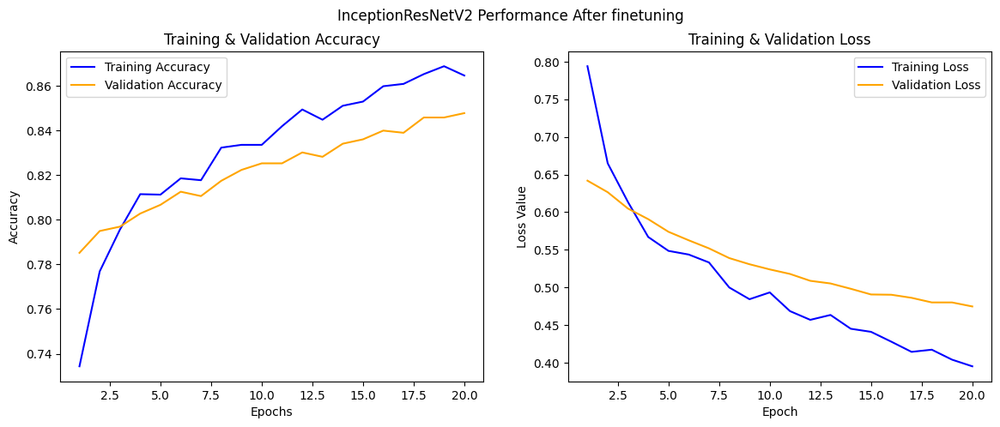

In [114]:
plot_Acc_loss(history=pre_hist,title='InceptionResNetV2 Performance')
plot_Acc_loss(history=history_finetune,title='InceptionResNetV2 Performance After finetuning')


------
### Try ResNet Model 

In [118]:
from tensorflow.keras.applications import ResNet152
# from tensorflow.keras.applications.resnet import preprocess_input

In [125]:
# Load Pretrained ResNet152 (exclude top layer)
res_base = ResNet152(include_top=False, weights='imagenet', input_shape=(224, 224, 3))
res_base.trainable = False  # Freeze the base model

In [126]:
# Input Layer
inputs = Input(shape=(224, 224, 3))
# Data Augmentation + Preprocessing
x = Lambda(keras.applications.resnet.preprocess_input)(inputs)  
x = RandomFlip()(x)
x = RandomRotation(0.1)(x)
x = RandomZoom(0.1)(x)

x = res_base(x)  
x = GlobalMaxPooling2D()(x)

# Fully Connected Layers
x = Dense(1024,kernel_initializer='he_normal')(x)
x = Dropout(0.4)(x)
x = Activation('relu')(x)

x = Dense(512,kernel_initializer='he_normal')(x)
x = Dropout(0.3)(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)

x = Dense(256,kernel_initializer='he_normal')(x)
x = Dropout(0.3)(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)

x = Dense(128, activation='relu',kernel_initializer='he_normal')(x)

outputs = Dense(num_classes, activation='softmax')(x)

# Final Model
resnet_model = Model(inputs=inputs, outputs=outputs, name='ResNet152_Classifier')
resnet_model.summary()


Model: "ResNet152_Classifier"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_21 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lambda_4 (Lambda)                    │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_flip_17 (RandomFlip)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_rotation_17 (RandomRotation)  │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_zoom_17 (RandomZoom)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ resnet152 (Functional)               │ (None, 7, 7, 2048)          │      58,370,944 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling2d_10              │ (None, 2048)                │               0 │
│ (GlobalMaxPooling2D)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_70 (Dense)                     │ (None, 1024)                │       2,098,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_31 (Dropout)                 │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_268 (Activation)          │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_71 (Dense)                     │ (None, 512)                 │         524,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_32 (Dropout)                 │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_264              │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_269 (Activation)          │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_72 (Dense)                     │ (None, 256)                 │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_33 (Dropout)                 │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_265              │ (None, 256)                 │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_270 (Activation)          │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_73 (Dense)                     │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_74 (Dense)                     │ (None, 11)                  │           1,4

 Total params: 61,162,635 (233.32 MB)

 Trainable params: 2,790,155 (10.64 MB)

 Non-trainable params: 58,372,480 (222.67 MB)

In [127]:
# Compile
resnet_model.compile(optimizer='adam',loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [128]:
resnet_history = resnet_model.fit(train, epochs=50, validation_data=valid)

Epoch 1/50
151/151 ━━━━━━━━━━━━━━━━━━━━ 71s 264ms/step - accuracy: 0.3610 - loss: 1.8776 - val_accuracy: 0.7432 - val_loss: 0.7473
Epoch 2/50
151/151 ━━━━━━━━━━━━━━━━━━━━ 31s 205ms/step - accuracy: 0.7296 - loss: 0.8060 - val_accuracy: 0.7861 - val_loss: 0.6154
Epoch 3/50
151/151 ━━━━━━━━━━━━━━━━━━━━ 31s 205ms/step - accuracy: 0.7493 - loss: 0.7388 - val_accuracy: 0.8418 - val_loss: 0.4786
Epoch 4/50
151/151 ━━━━━━━━━━━━━━━━━━━━ 31s 205ms/step - accuracy: 0.7982 - loss: 0.5920 - val_accuracy: 0.8154 - val_loss: 0.5132
Epoch 5/50
151/151 ━━━━━━━━━━━━━━━━━━━━ 31s 205ms/step - accuracy: 0.7907 - loss: 0.6046 - val_accuracy: 0.8496 - val_loss: 0.4419
Epoch 6/50
151/151 ━━━━━━━━━━━━━━━━━━━━ 31s 205ms/step - accuracy: 0.8256 - loss: 0.5160 - val_accuracy: 0.8594 - val_loss: 0.4209
Epoch 7/50
151/151 ━━━━━━━━━━━━━━━━━━━━ 31s 206ms/step - accuracy: 0.8301 - loss: 0.5026 - val_accuracy: 0.8486 - val_loss: 0.4510
Epoch 8/50
151/151 ━━━━━━━━━━━━━━━━━━━━ 31s 206ms/step - accuracy: 0.8439 - loss: 0

In [131]:
## Evaluation
## before finetune the layers of the model
train_loss,train_acc = resnet_model.evaluate(train)
val_loss,val_acc = resnet_model.evaluate(valid)
test_loss,test_acc = resnet_model.evaluate(test)

print(f'Training Acurracy: {train_acc}')
print(f'Validation Acurracy: {val_acc}')
print(f'Test Acurracy: {test_acc}')

151/151 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - accuracy: 0.9548 - loss: 0.1344
32/32 ━━━━━━━━━━━━━━━━━━━━ 5s 165ms/step - accuracy: 0.8591 - loss: 0.4454
33/33 ━━━━━━━━━━━━━━━━━━━━ 6s 172ms/step - accuracy: 0.8917 - loss: 0.3949
Training Acurracy: 0.9577435255050659
Validation Acurracy: 0.875
Test Acurracy: 0.8897485733032227


In [132]:
# Unfreeze the base model
res_base.trainable = True

# Freeze all layers except the last 30
for layer in res_base.layers[:-30]:
    layer.trainable = False


In [133]:
resnet_model.compile(optimizer = keras.optimizers.Adam(learning_rate=1e-5),loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [134]:
resnet_finetune = resnet_model.fit(train, epochs=10, validation_data=valid)

Epoch 1/10
151/151 ━━━━━━━━━━━━━━━━━━━━ 82s 290ms/step - accuracy: 0.8975 - loss: 0.3243 - val_accuracy: 0.8779 - val_loss: 0.4229
Epoch 2/10
151/151 ━━━━━━━━━━━━━━━━━━━━ 35s 231ms/step - accuracy: 0.9153 - loss: 0.2610 - val_accuracy: 0.8799 - val_loss: 0.4264
Epoch 3/10
151/151 ━━━━━━━━━━━━━━━━━━━━ 35s 231ms/step - accuracy: 0.9201 - loss: 0.2349 - val_accuracy: 0.8799 - val_loss: 0.4084
Epoch 4/10
151/151 ━━━━━━━━━━━━━━━━━━━━ 35s 231ms/step - accuracy: 0.9317 - loss: 0.2022 - val_accuracy: 0.8828 - val_loss: 0.4063
Epoch 5/10
151/151 ━━━━━━━━━━━━━━━━━━━━ 35s 231ms/step - accuracy: 0.9307 - loss: 0.1977 - val_accuracy: 0.8818 - val_loss: 0.3863
Epoch 6/10
151/151 ━━━━━━━━━━━━━━━━━━━━ 35s 231ms/step - accuracy: 0.9467 - loss: 0.1531 - val_accuracy: 0.8809 - val_loss: 0.3873
Epoch 7/10
151/151 ━━━━━━━━━━━━━━━━━━━━ 35s 231ms/step - accuracy: 0.9501 - loss: 0.1483 - val_accuracy: 0.8848 - val_loss: 0.3893
Epoch 8/10
151/151 ━━━━━━━━━━━━━━━━━━━━ 35s 231ms/step - accuracy: 0.9464 - loss: 0

In [135]:
## Evaluation & save the model.

save_model_data('ResnetModel152',resnet_model)

151/151 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - accuracy: 0.9732 - loss: 0.0795
32/32 ━━━━━━━━━━━━━━━━━━━━ 5s 165ms/step - accuracy: 0.8643 - loss: 0.4086
33/33 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - accuracy: 0.9051 - loss: 0.3710
Training Acurracy: 97.39800095558167
Validation Acurracy: 88.28125
Test Acurracy: 90.8123791217804
Model Data saved Successfully.


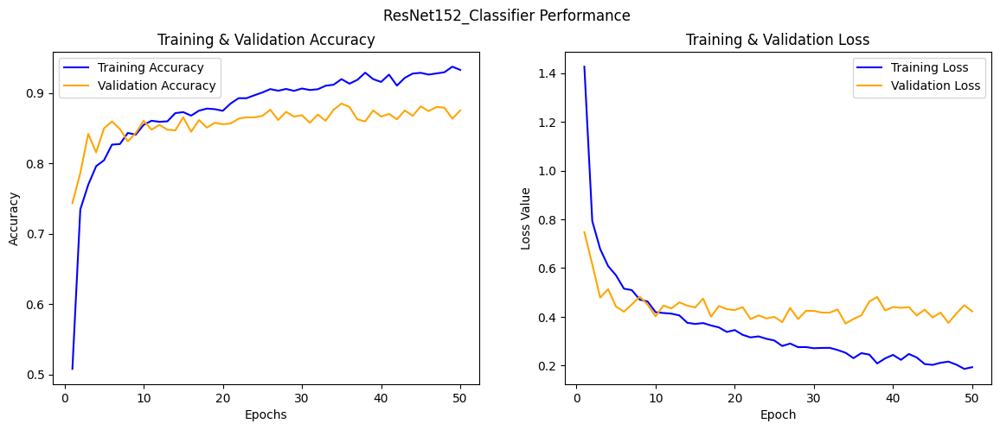

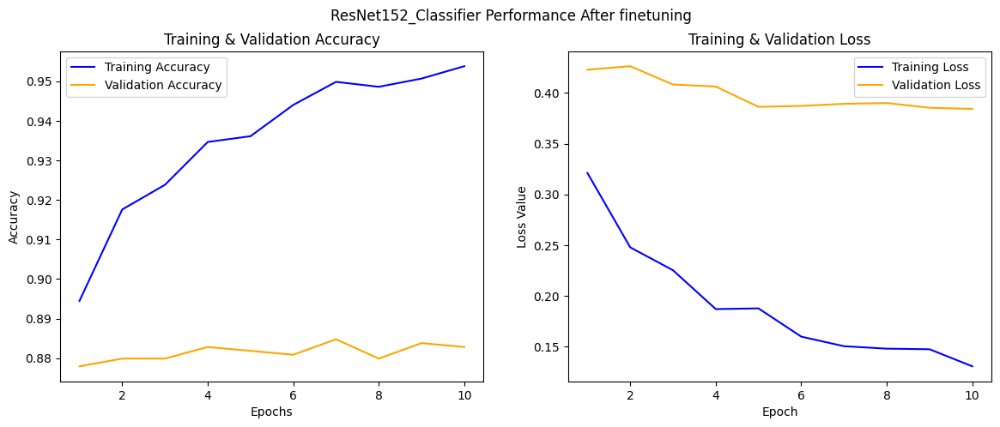

In [136]:
plot_Acc_loss(history= resnet_history,title='ResNet152_Classifier Performance')
plot_Acc_loss(history= resnet_finetune,title='ResNet152_Classifier Performance After finetuning')

1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step


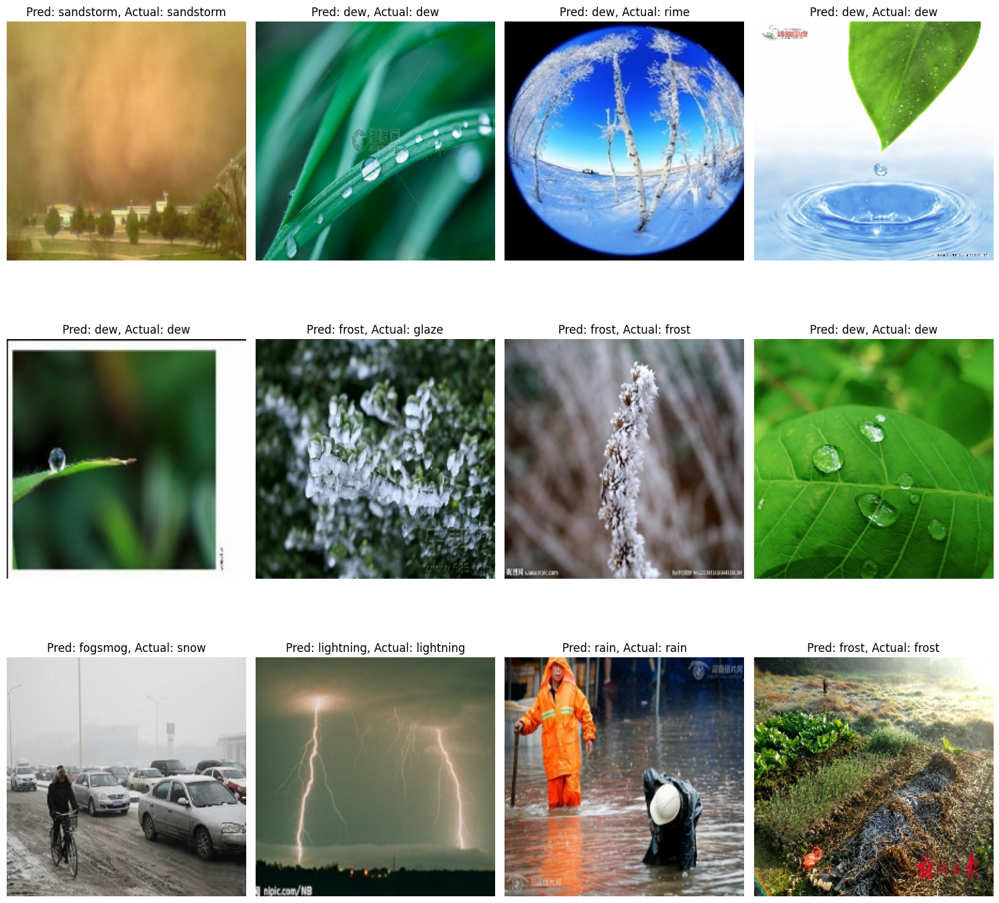

In [137]:
plot_true_pred(model=resnet_model)

33/33 ━━━━━━━━━━━━━━━━━━━━ 21s 429ms/step


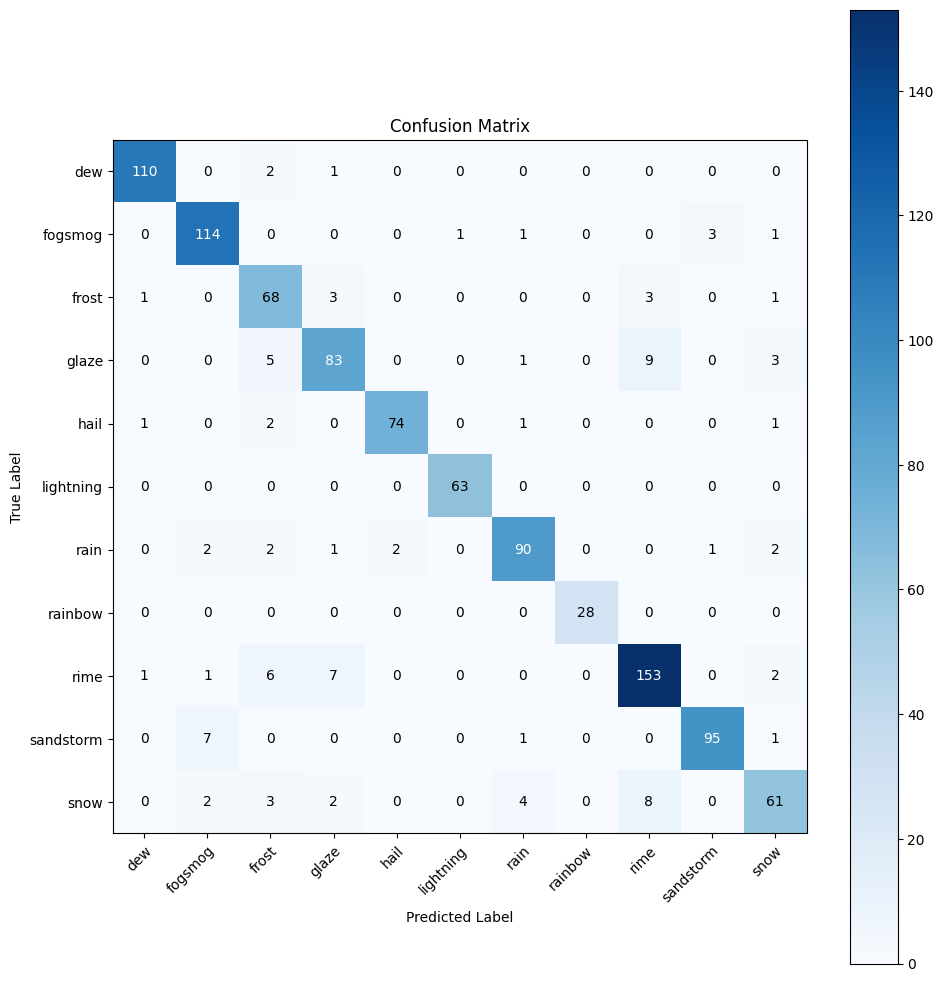

In [138]:
y_pred = np.argmax(resnet_model.predict(test), axis=1)
plot_confusionMatrix()


In [139]:
report = classification_report(y_true, y_pred, target_names=class_names, output_dict=True)
df = pd.DataFrame(report).transpose()
df

,precision,recall,f1-score,support
dew,0.973451,0.973451,0.973451,113.000000
fogsmog,0.904762,0.950000,0.926829,120.000000
frost,0.772727,0.894737,0.829268,76.000000
glaze,0.855670,0.821782,0.838384,101.000000
hail,0.973684,0.936709,0.954839,79.000000
lightning,0.984375,1.000000,0.992126,63.000000
rain,0.918367,0.900000,0.909091,100.000000
rainbow,1.000000,1.000000,1.000000,28.000000
rime,0.884393,0.900000,0.892128,170.000000
sandstorm,0.959596,0.913462,0.935961,104.000000


----
### Try EfficientNetV2B2

In [129]:
from keras.applications import EfficientNetV2B2
# from keras.applications.efficientnet_v2 import preprocess_input as pre_input

In [130]:
## load the model.
efficient_base = EfficientNetV2B2(include_top=False, weights='imagenet', input_shape=(224, 224, 3))
efficient_base.trainable = False  # Freeze the base model

35839040/35839040 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [140]:
# Input Layer
inputs = Input(shape=(224, 224, 3))
x = Lambda(keras.applications.efficientnet_v2.preprocess_input)(inputs)
x = RandomFlip()(x)
x = RandomRotation(0.2)(x)
x = RandomZoom(0.2)(x)

  
x = efficient_base(x)  
x = GlobalMaxPooling2D()(x)
x = BatchNormalization()(x)

# Fully Connected Layers
x = Dense(1024,kernel_initializer='he_normal')(x)
x = Dropout(0.4)(x)
x = Activation('relu')(x)

x = Dense(512,kernel_initializer='he_normal')(x)
x = Dropout(0.3)(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)

x = Dense(256,kernel_initializer='he_normal')(x)
x = Dropout(0.3)(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)

x = Dense(128, activation='relu',kernel_initializer='he_normal')(x)

outputs = Dense(num_classes, activation='softmax')(x)

# Final Model
efficient_model = Model(inputs=inputs, outputs=outputs, name='EfficientNetV2B2_Classifier')
efficient_model.summary()



Model: "EfficientNetV2B2_Classifier"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_23 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lambda_5 (Lambda)                    │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_flip_18 (RandomFlip)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_rotation_18 (RandomRotation)  │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_zoom_18 (RandomZoom)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetv2-b2 (Functional)       │ (None, 7, 7, 1408)          │       8,769,374 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling2d_11              │ (None, 1408)                │               0 │
│ (GlobalMaxPooling2D)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_266              │ (None, 1408)                │           5,632 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_75 (Dense)                     │ (None, 1024)                │       1,442,816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_34 (Dropout)                 │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_271 (Activation)          │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_76 (Dense)                     │ (None, 512)                 │         524,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_35 (Dropout)                 │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_267              │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_272 (Activation)          │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_77 (Dense)                     │ (None, 256)                 │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_36 (Dropout)                 │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_268              │ (None, 256)                 │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_273 (Activation)          │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 10,911,337 (41.62 MB)

 Trainable params: 2,137,611 (8.15 MB)

 Non-trainable params: 8,773,726 (33.47 MB)

In [141]:
efficient_model.compile(optimizer=keras.optimizers.Adam(),loss='sparse_categorical_crossentropy',metrics=['accuracy'])

In [142]:
efficient_hist = efficient_model.fit(train,epochs=50,validation_data=valid)

Epoch 1/50


E0000 00:00:1747580653.236466      35 meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/EfficientNetV2B2_Classifier_1/efficientnetv2-b2_1/block1b_drop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


151/151 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - accuracy: 0.3745 - loss: 1.8535 - val_accuracy: 0.7070 - val_loss: 0.8938
Epoch 2/50
151/151 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.6570 - loss: 1.0054 - val_accuracy: 0.7295 - val_loss: 0.8074
Epoch 3/50
151/151 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.6978 - loss: 0.8647 - val_accuracy: 0.7588 - val_loss: 0.6785
Epoch 4/50
151/151 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.7364 - loss: 0.7798 - val_accuracy: 0.7520 - val_loss: 0.7155
Epoch 5/50
151/151 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.7450 - loss: 0.7544 - val_accuracy: 0.7832 - val_loss: 0.6426
Epoch 6/50
151/151 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.7633 - loss: 0.6948 - val_accuracy: 0.7842 - val_loss: 0.6444
Epoch 7/50
151/151 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.7619 - loss: 0.6807 - val_accuracy: 0.7920 - val_loss: 0.6175
Epoch 8/50
151/151 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0.7812 - loss: 0.6477 - val_accuracy: 0.79

In [143]:
## Evaluation
train_loss,train_acc = efficient_model.evaluate(train)
val_loss,val_acc = efficient_model.evaluate(valid)
test_loss,test_acc = efficient_model.evaluate(test)

print(f'Training Acurracy: {train_acc}')
print(f'Validation Acurracy: {val_acc}')
print(f'Test Acurracy: {test_acc}')

151/151 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step - accuracy: 0.9062 - loss: 0.2764
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step - accuracy: 0.8170 - loss: 0.5764
33/33 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - accuracy: 0.8568 - loss: 0.4927
Training Acurracy: 0.9096586108207703
Validation Acurracy: 0.8251953125
Test Acurracy: 0.8529980778694153


In [144]:
def unfreeze_model(model):
    # We unfreeze the top 20 layers while leaving BatchNorm layers frozen
    for layer in model.layers[-20:]:
        if not isinstance(layer, BatchNormalization):
            layer.trainable = True  ##The BatchNormalization layers need to be kept frozen (more details).
            ##If they are also turned to trainable, the first epoch after unfreezing will significantly reduce accuracy.

    optimizer = keras.optimizers.Adam(learning_rate=1e-5)
    model.compile(optimizer=optimizer, loss="sparse_categorical_crossentropy", metrics=["accuracy"])


unfreeze_model(efficient_model)

In [145]:
efficient_finetune = efficient_model.fit(train,epochs=10,validation_data= valid)

Epoch 1/10


E0000 00:00:1747581289.631992      35 meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/EfficientNetV2B2_Classifier_1/efficientnetv2-b2_1/block1b_drop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


151/151 ━━━━━━━━━━━━━━━━━━━━ 131s 280ms/step - accuracy: 0.6895 - loss: 1.0561 - val_accuracy: 0.6680 - val_loss: 1.2465
Epoch 2/10
151/151 ━━━━━━━━━━━━━━━━━━━━ 34s 226ms/step - accuracy: 0.7313 - loss: 0.8809 - val_accuracy: 0.7021 - val_loss: 1.1219
Epoch 3/10
151/151 ━━━━━━━━━━━━━━━━━━━━ 34s 226ms/step - accuracy: 0.7568 - loss: 0.7865 - val_accuracy: 0.7148 - val_loss: 1.0092
Epoch 4/10
151/151 ━━━━━━━━━━━━━━━━━━━━ 34s 226ms/step - accuracy: 0.7906 - loss: 0.6498 - val_accuracy: 0.7334 - val_loss: 0.9500
Epoch 5/10
151/151 ━━━━━━━━━━━━━━━━━━━━ 34s 226ms/step - accuracy: 0.7860 - loss: 0.6696 - val_accuracy: 0.7510 - val_loss: 0.8796
Epoch 6/10
151/151 ━━━━━━━━━━━━━━━━━━━━ 34s 226ms/step - accuracy: 0.8043 - loss: 0.5824 - val_accuracy: 0.7607 - val_loss: 0.8414
Epoch 7/10
151/151 ━━━━━━━━━━━━━━━━━━━━ 34s 226ms/step - accuracy: 0.8173 - loss: 0.5513 - val_accuracy: 0.7744 - val_loss: 0.7943
Epoch 8/10
151/151 ━━━━━━━━━━━━━━━━━━━━ 34s 226ms/step - accuracy: 0.8175 - loss: 0.5381 - va

In [146]:
## Evaluation
train_loss,train_acc = efficient_model.evaluate(train)
val_loss,val_acc = efficient_model.evaluate(valid)
test_loss,test_acc = efficient_model.evaluate(test)

print(f'Training Acurracy: {train_acc}')
print(f'Validation Acurracy: {val_acc}')
print(f'Test Acurracy: {test_acc}')

151/151 ━━━━━━━━━━━━━━━━━━━━ 7s 46ms/step - accuracy: 0.8482 - loss: 0.4837
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - accuracy: 0.7791 - loss: 0.7413
33/33 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - accuracy: 0.7858 - loss: 0.7089
Training Acurracy: 0.8426311612129211
Validation Acurracy: 0.796875
Test Acurracy: 0.7833655476570129


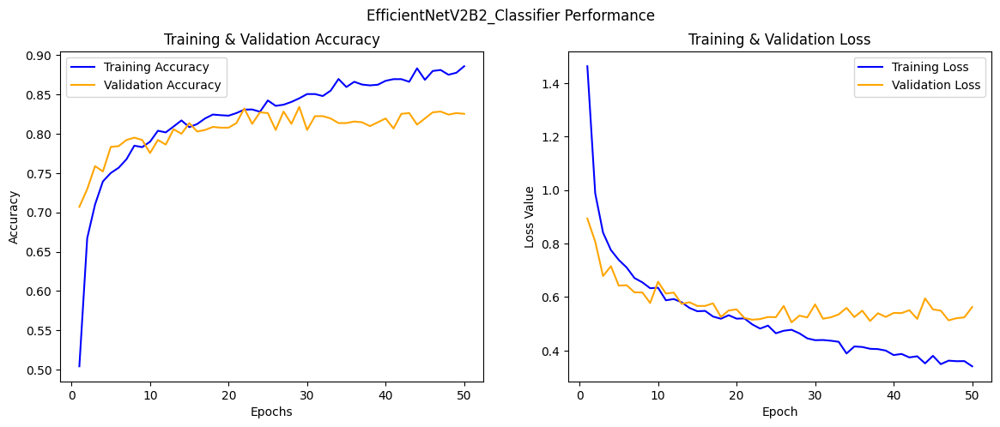

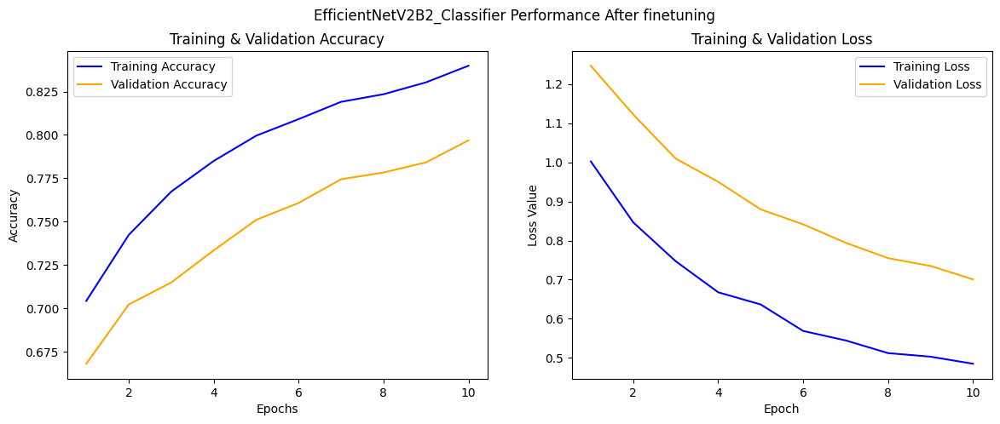

In [147]:
plot_Acc_loss(history= efficient_hist,title='EfficientNetV2B2_Classifier Performance')
plot_Acc_loss(history=efficient_finetune ,title='EfficientNetV2B2_Classifier Performance After finetuning')

33/33 ━━━━━━━━━━━━━━━━━━━━ 9s 168ms/step


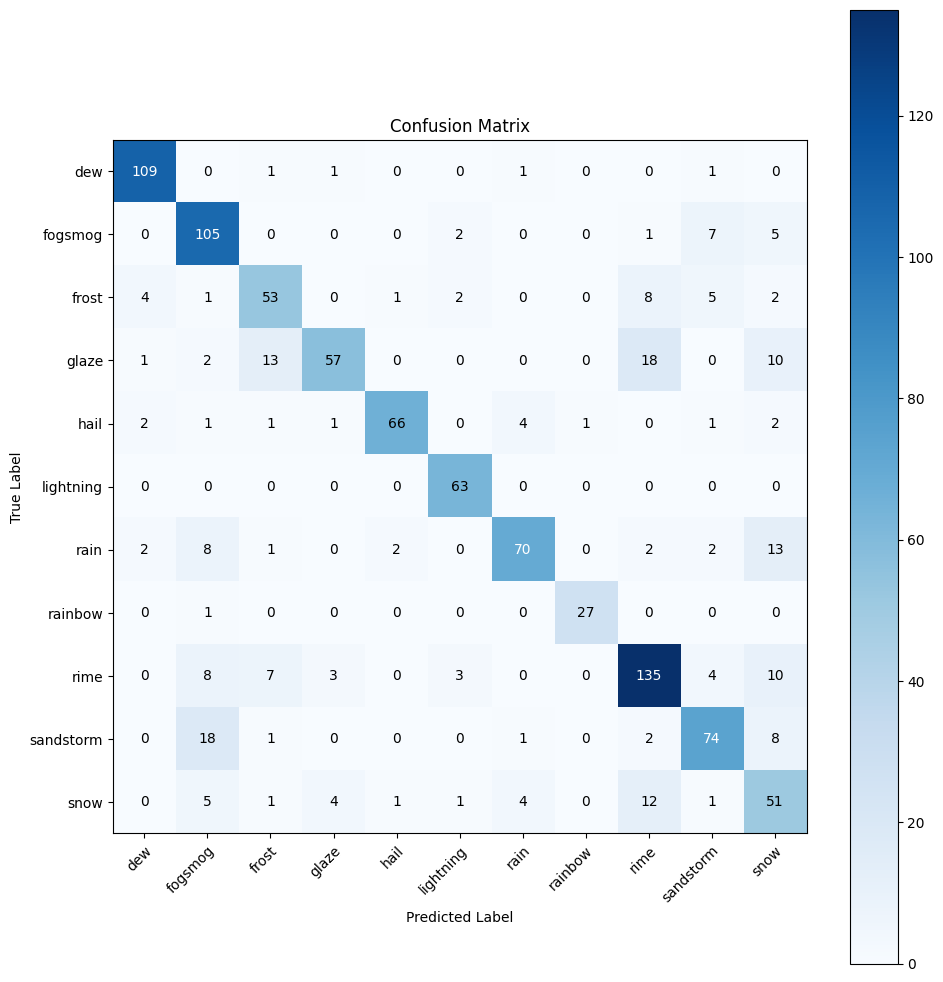

In [148]:
y_pred = np.argmax(efficient_model.predict(test), axis=1)
plot_confusionMatrix()


In [149]:
report = classification_report(y_true, y_pred, target_names=class_names, output_dict=True)
df = pd.DataFrame(report).transpose()
df

,precision,recall,f1-score,support
dew,0.923729,0.964602,0.943723,113.000000
fogsmog,0.704698,0.875000,0.780669,120.000000
frost,0.679487,0.697368,0.688312,76.000000
glaze,0.863636,0.564356,0.682635,101.000000
hail,0.942857,0.835443,0.885906,79.000000
lightning,0.887324,1.000000,0.940299,63.000000
rain,0.875000,0.700000,0.777778,100.000000
rainbow,0.964286,0.964286,0.964286,28.000000
rime,0.758427,0.794118,0.775862,170.000000
sandstorm,0.778947,0.711538,0.743719,104.000000


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


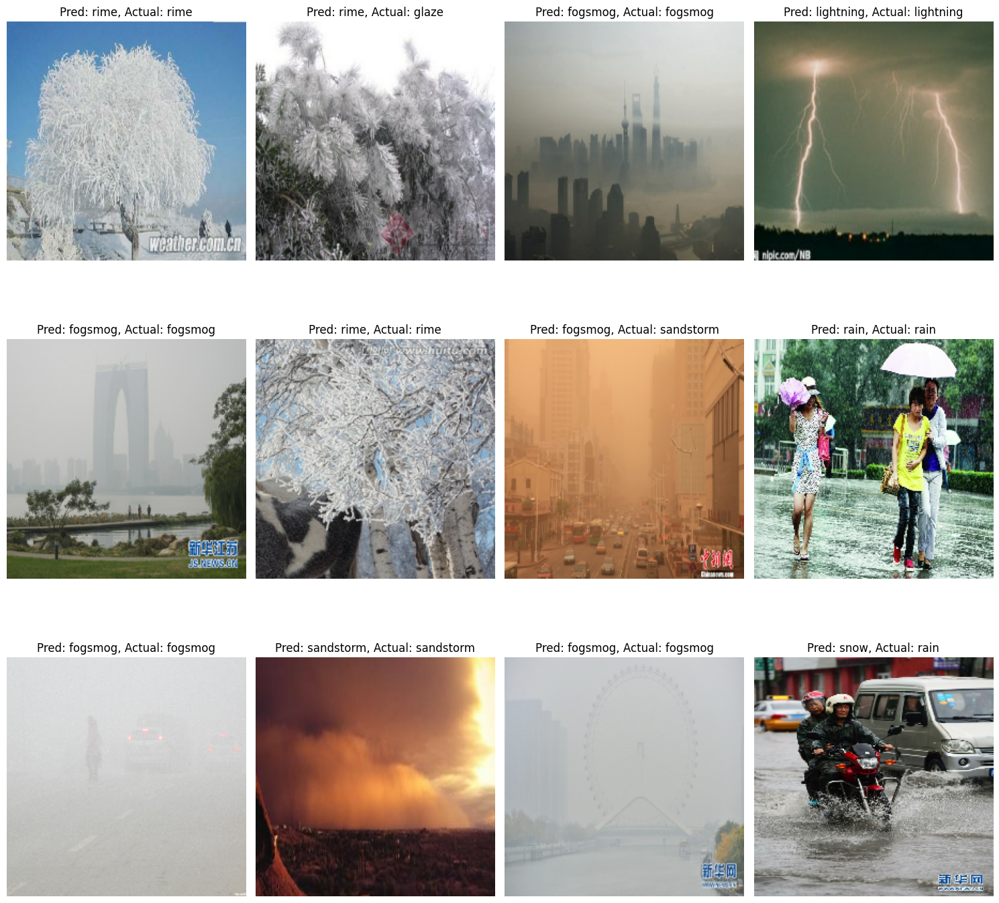

In [150]:
plot_true_pred(model=efficient_model)

### Convert models_data into DataFrame and save it as CSV file

In [ ]:
## saving the data and converting it into a dataframe
model_df = pd.DataFrame(model_data)
model_df

,Model_name,Train_Accuracy,Validation_Accuracy,Test_Accuracy
0,ScratchModel1,79.30,72.10,72.00
1,ScratchModel2,79.20,68.45,71.17
2,Scratch_Model_With_SkipConnection,76.24,70.21,74.17
3,InceptionResNetV2,89.55,84.76,85.10
4,ResnetModel152,97.93,88.28,90.81
5,EfficientNetV2B2,90.90,82.50,85.29


In [4]:
model_df.to_csv('Models_data.csv')